In [45]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from google.colab import drive
import os
import time

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [46]:
data_path = '/content/drive/MyDrive/TestSet1/TestSet1'
files = os.listdir(data_path)
files = sorted(files)

data_path_2 = '/content/drive/MyDrive/TestSet2/TestSet2'
files_2 = os.listdir(data_path_2)
files_2 = sorted(files_2)

Будем решать задачу следующим образом. С помощью cv2.findContours выделим координаты всех точек, составляющими контуры на изображении. Далее воспользуемся методом кластеризации DBSCAN, реализованным в sklearn. После кластеризации получим несколько десятков/сотен объектов, среди которых есть qr-код (обычно, он попадает в отдельный объект, поскольку обычно отделен от других объектов пустым пространством). Для того чтобы понять, какой из объектов является qr-кодом, я решил воспользоваться следующими эвристиками. Во-первых, qr-код состоит из большого количества линий, а значит на нем детектируется большое количество точек. Поэтому в качестве qr-кода я решил брать объект с наибольшим колиечеством задетектированных точек. Во-вторых qr-код обычно квадратный, а поэтому я проверяю что объект имеет примерно квадратную форму и только тогда применяю первый пункт. И в-третьих, упомянутым пунктам очень часто соответствуют большие объекты по типу фона, поэтому их тоже стоит отсечь, я это делаю на основании размера. Итак, мы получаем контуры qr-кодов. Они часто шумные, но если взять крайние точки и соединить их, то получится нормальный контур. Чтобы получить finder-pattern-ы достаточно разделить стороны на равные части и взять соответствующую часть.

In [48]:
from IPython.core.display import set_matplotlib_formats
def find_qr_code(filename):
  start = time.time()

  image = cv2.imread(filename)
  cv2.waitKey(0)
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  edged = cv2.Canny(gray, 30, 200)
  cv2.waitKey(0)
  contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  cv2.waitKey(0)

  all_dots = np.concatenate([contour.reshape(contour.shape[0], 2) for contour in contours], axis=0)

  clustering = DBSCAN(eps=3, min_samples=2).fit(all_dots)
  labels = clustering.labels_

  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \
         / (all_dots[labels==label][:, 1].max() - all_dots[labels==label][:, 1].min())) for label in np.unique(labels)]))
  squares = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \
         * (all_dots[labels==label][:, 1].max() - all_dots[labels==label][:, 1].min())) for label in np.unique(labels)]))
  
  diffs[diffs > 1e10] = 0

  counts = np.unique(labels, return_counts=True)[1]
  counts[(diffs - 1) > np.quantile((diffs - 1), 0.9)] = 0
  counts[squares == squares.max()] = 0
  qr_label = counts.argmax() + np.unique(labels)[0]

  time_last = time.time() - start

  plt.scatter(all_dots[:, 0][labels==qr_label], all_dots[:, 1][labels==qr_label], s=0.1)
  img_name = filename.split('/')[-1]
  plt.title(f'{img_name}, qr_label={qr_label}')
  plt.show()


  return all_dots[labels==qr_label], time_last

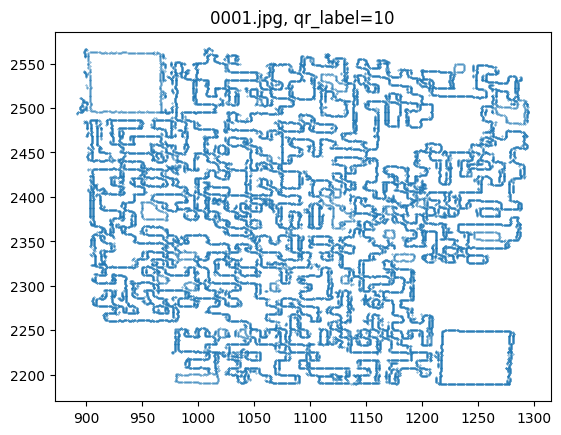

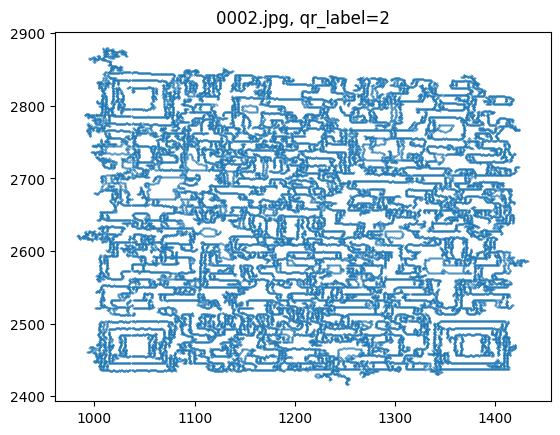

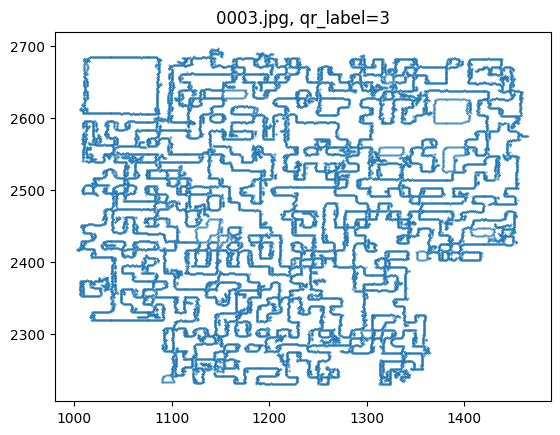

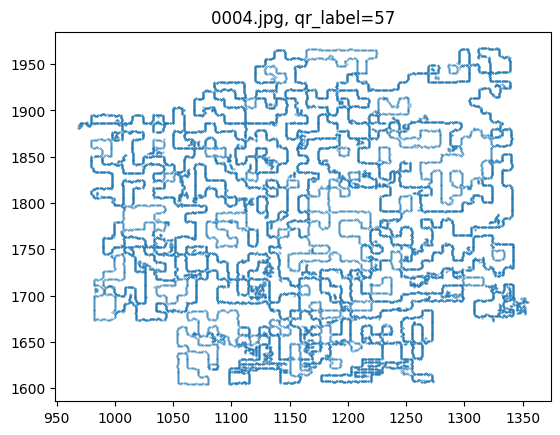

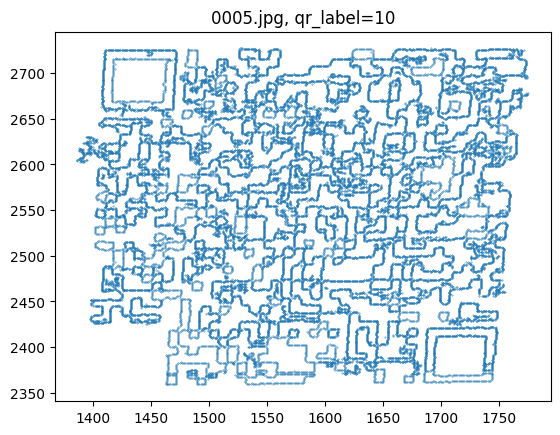

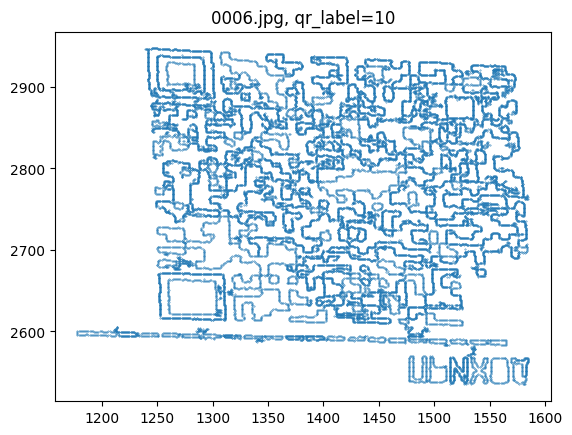

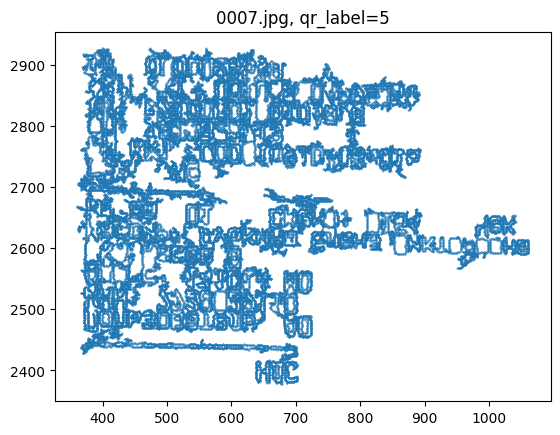

<ipython-input-48-6cf586ed01d9>:18: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


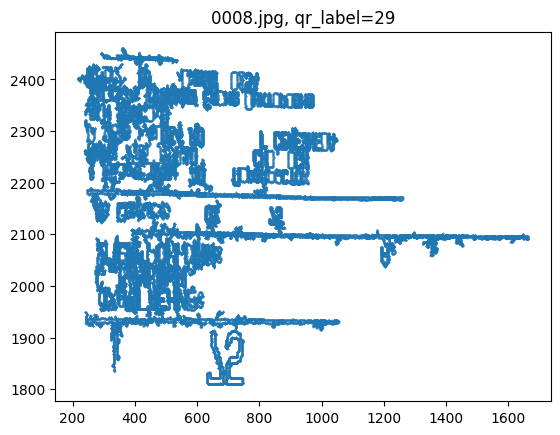

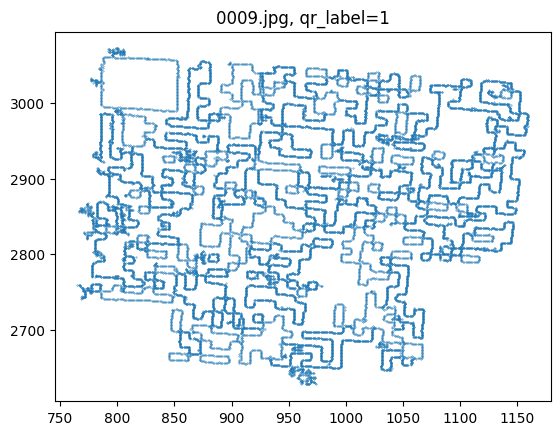

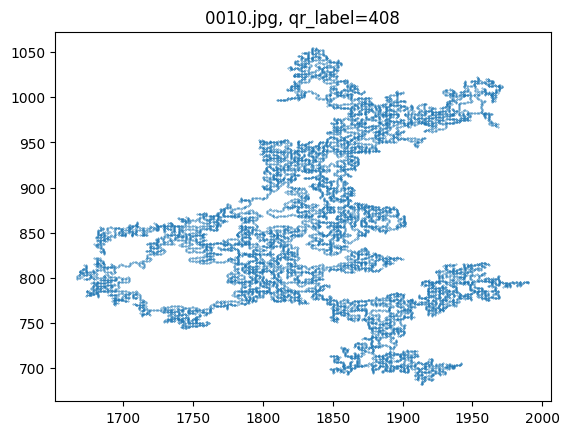

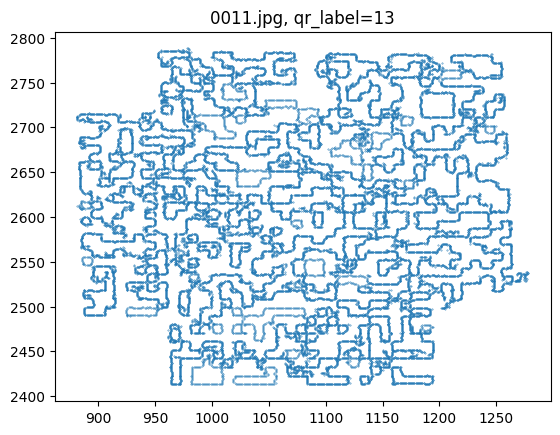

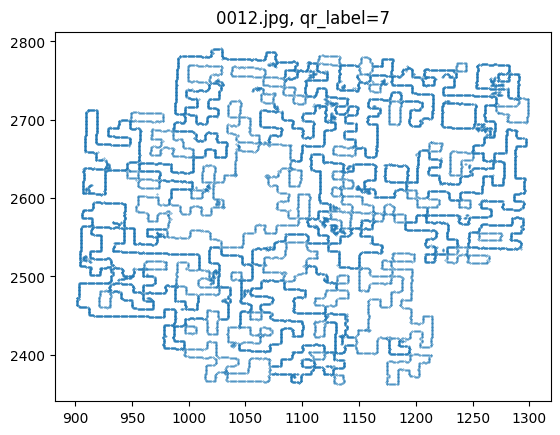

<ipython-input-48-6cf586ed01d9>:18: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


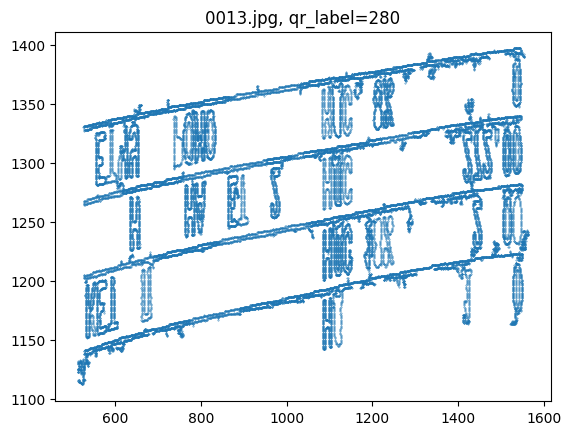

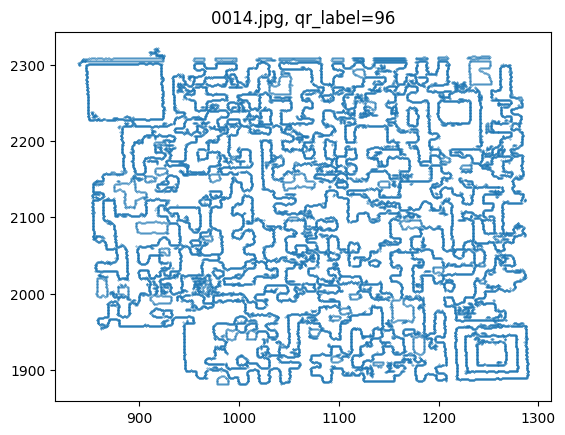

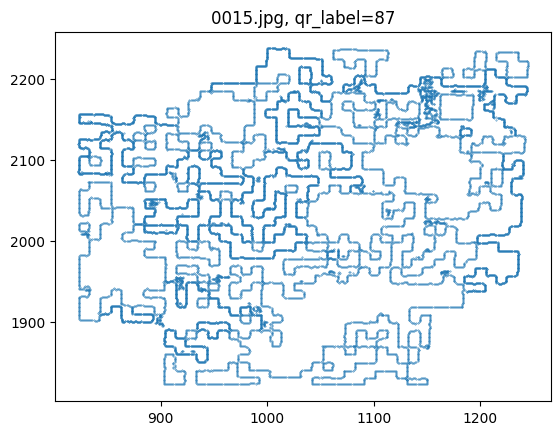

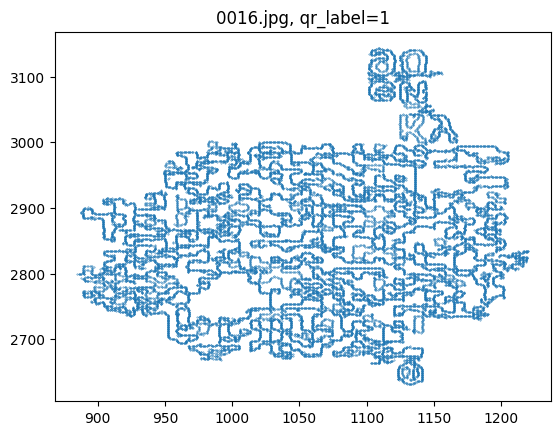

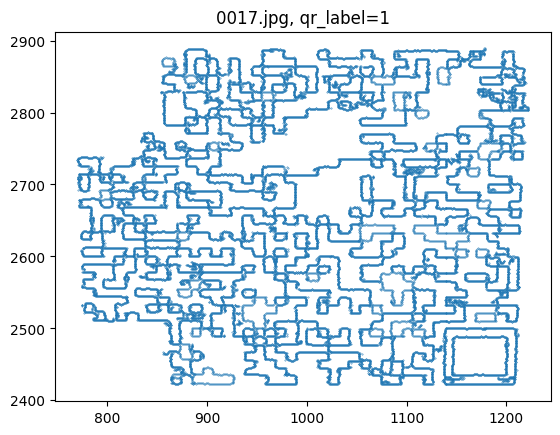

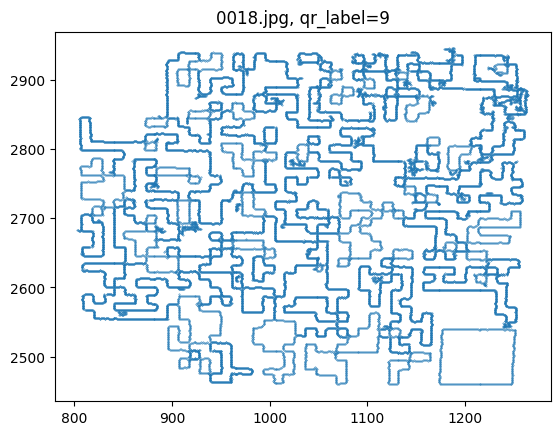

<ipython-input-48-6cf586ed01d9>:18: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


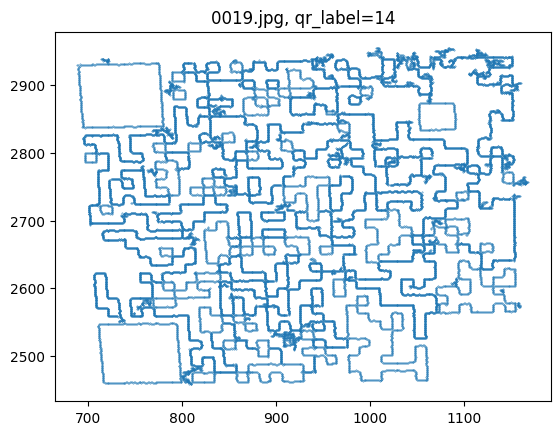

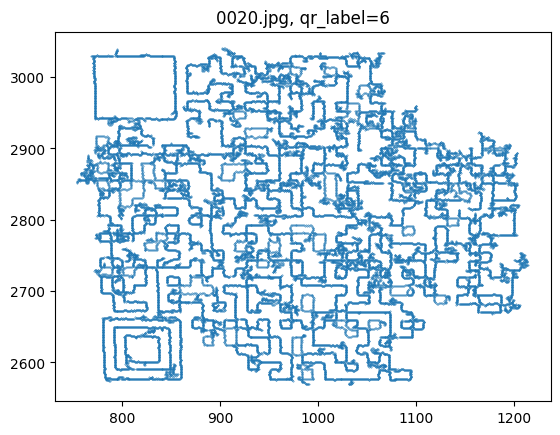

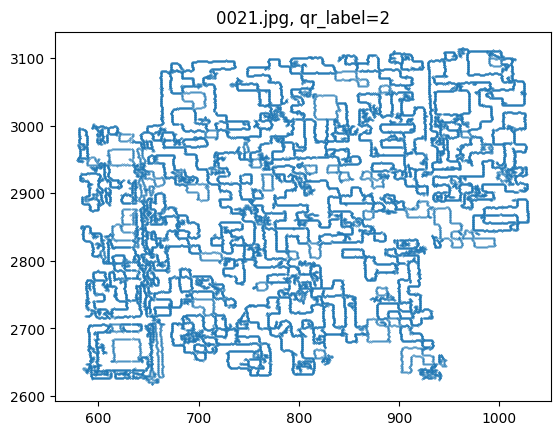

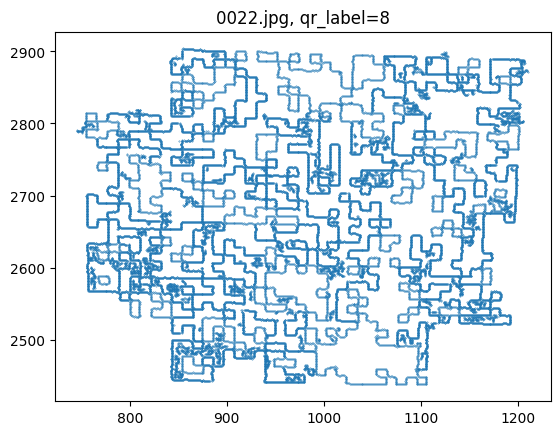

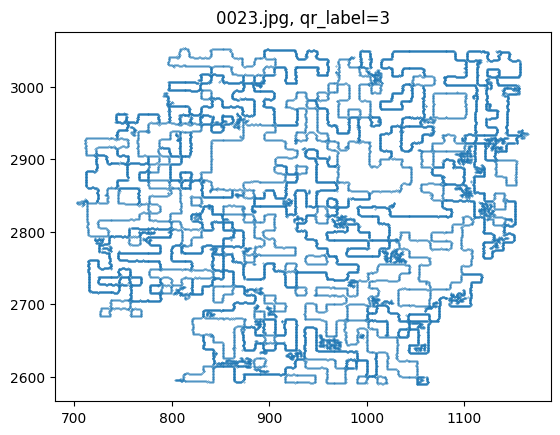

...

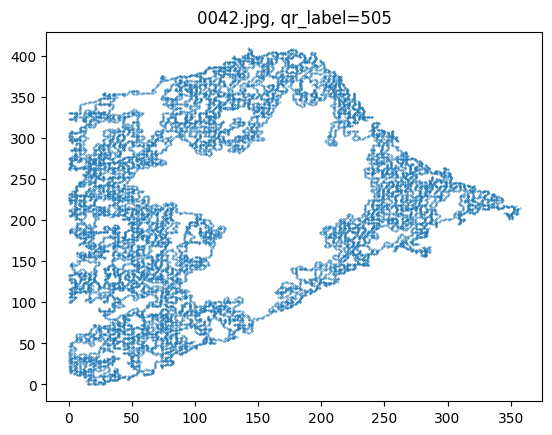

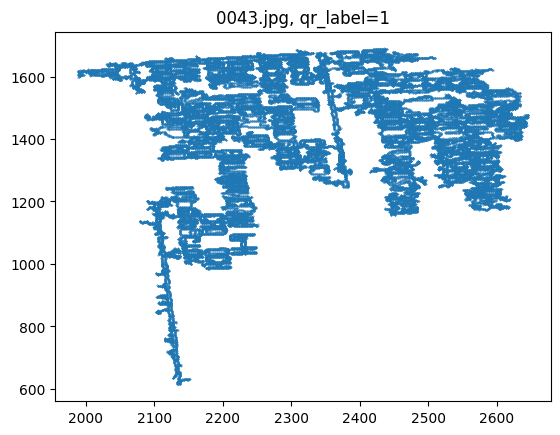

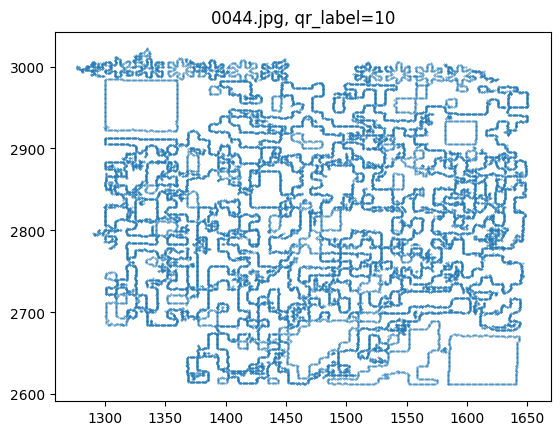

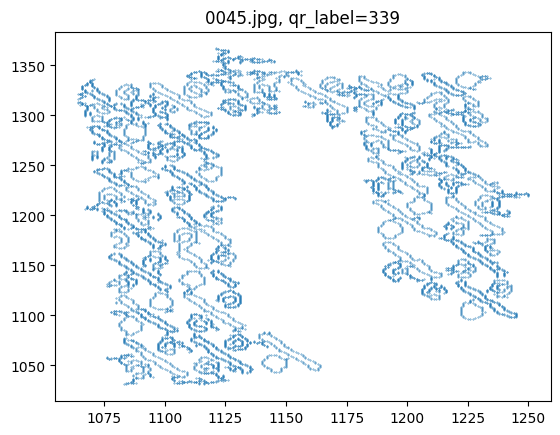

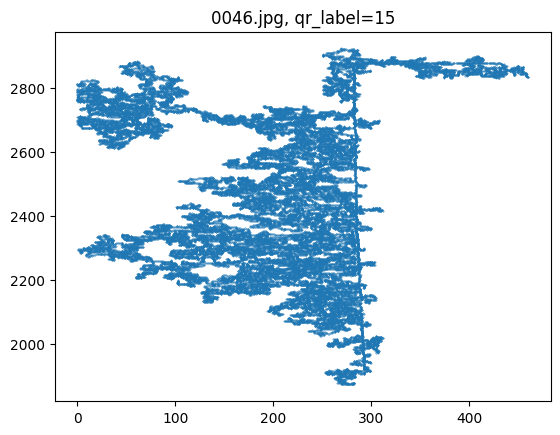

<ipython-input-48-6cf586ed01d9>:18: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


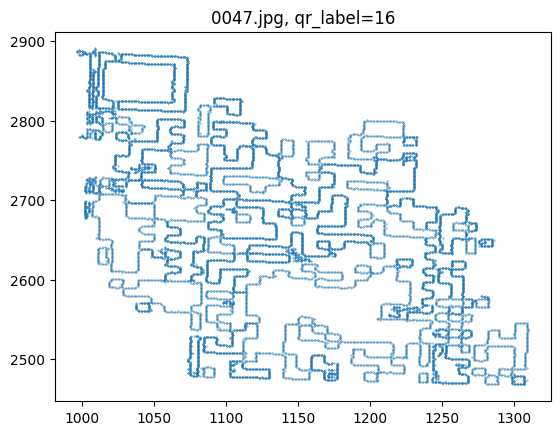

In [49]:
times = []
for file in files:
  times.append(find_qr_code(data_path + '/' + file)[1])

Precision: 0.61 \
Recall: 0.68

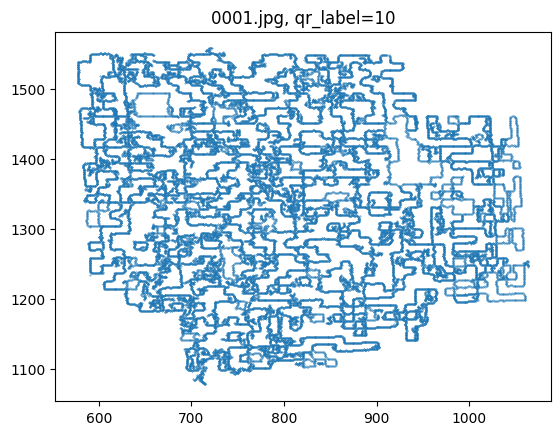

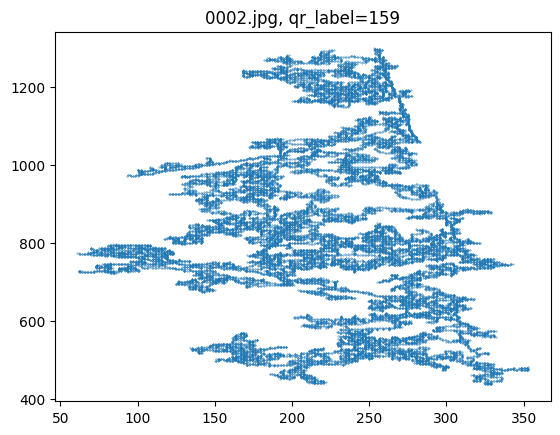

<ipython-input-41-f18ba388185c>:15: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


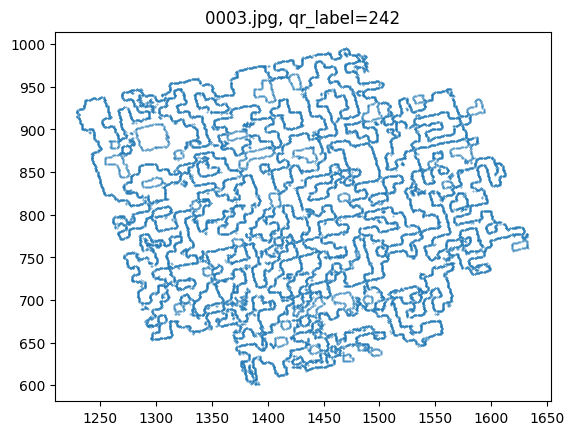

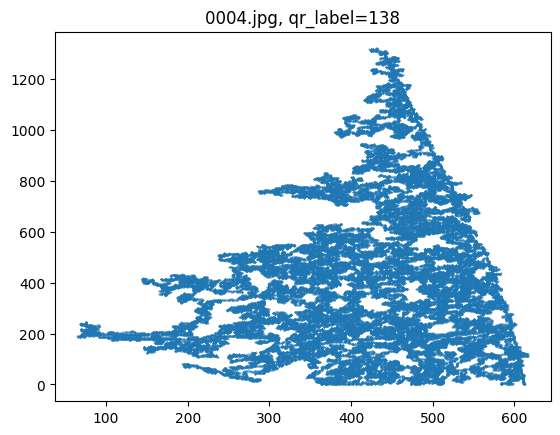

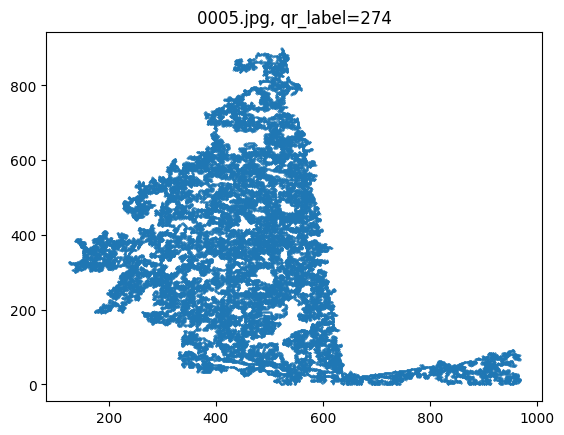

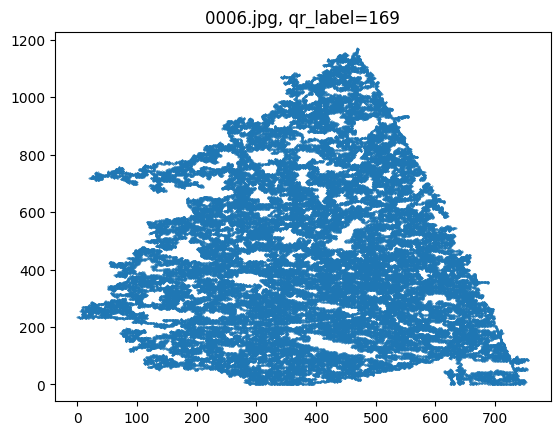

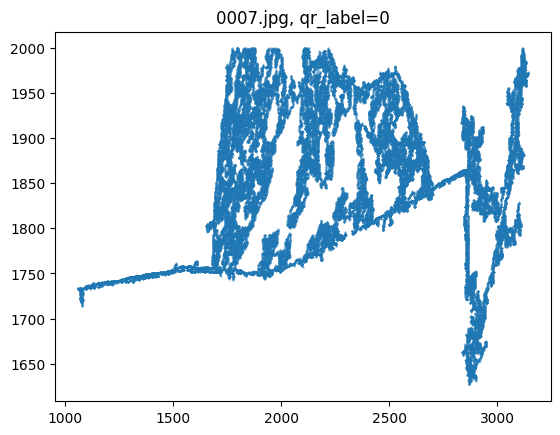

...

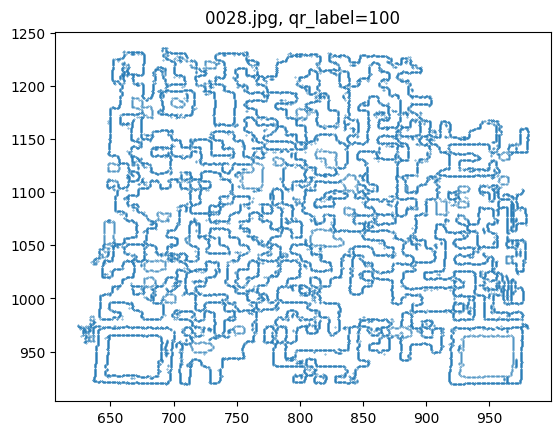

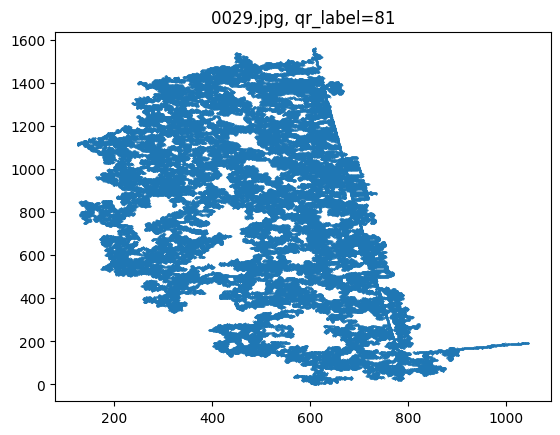

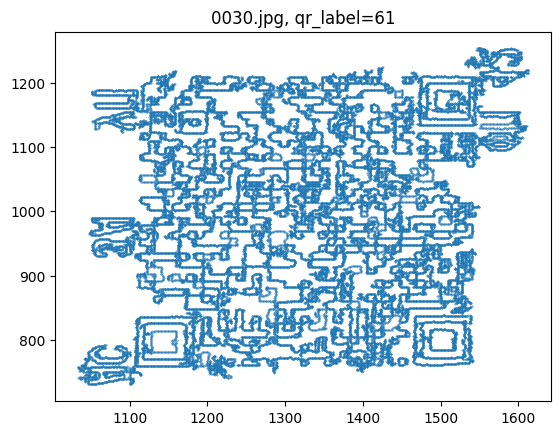

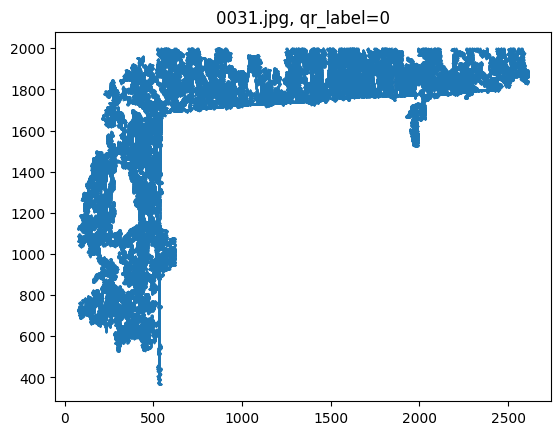

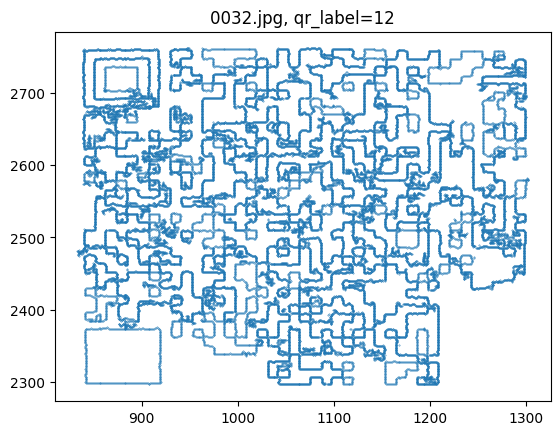

<ipython-input-41-f18ba388185c>:15: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


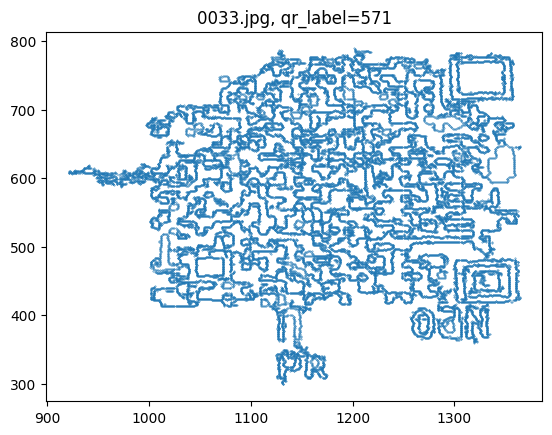

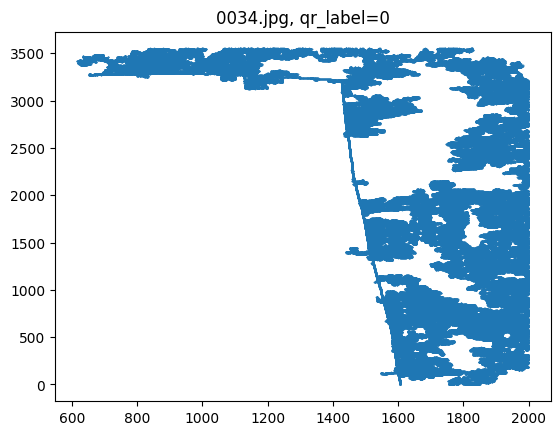

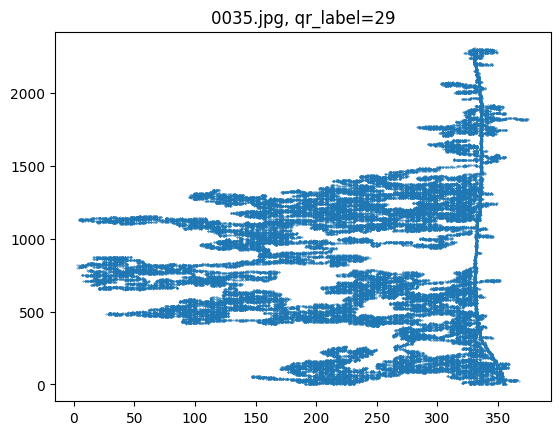

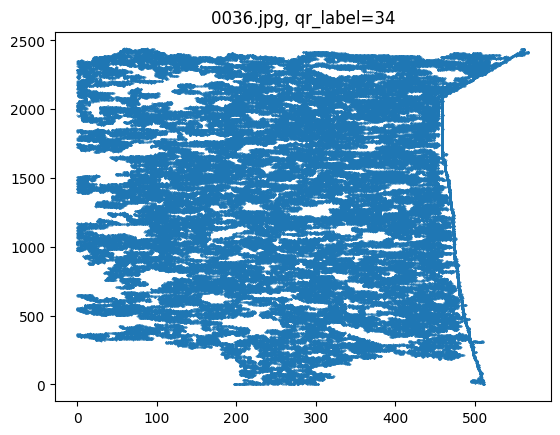

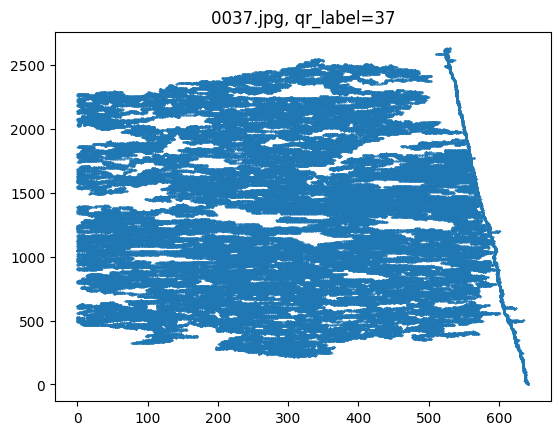

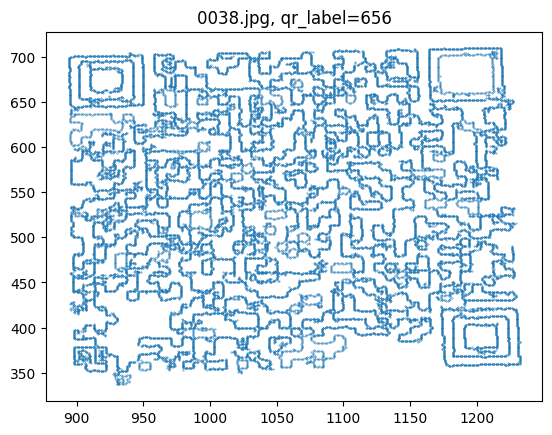

<ipython-input-41-f18ba388185c>:15: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


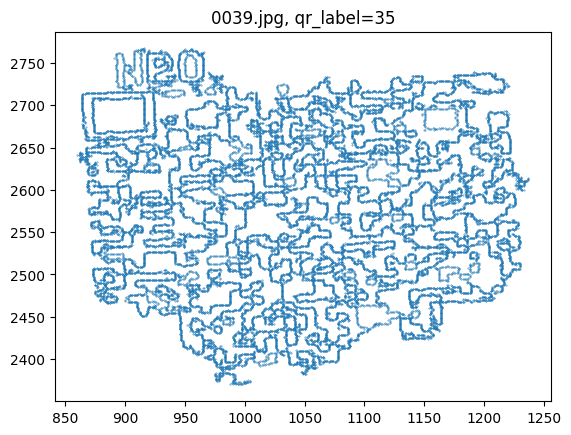

<ipython-input-41-f18ba388185c>:15: RuntimeWarning: divide by zero encountered in int_scalars
  diffs = np.abs(np.array([((all_dots[labels==label][:, 0].max() - all_dots[labels==label][:, 0].min()) \


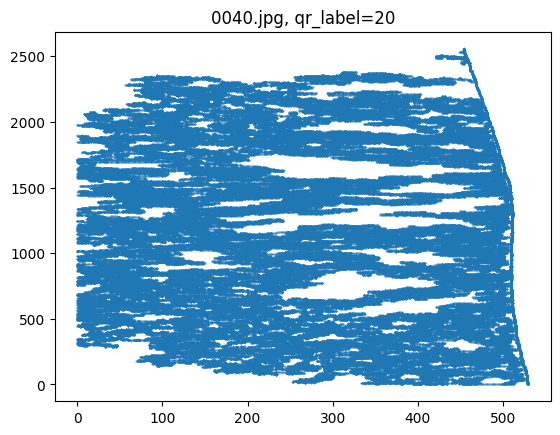

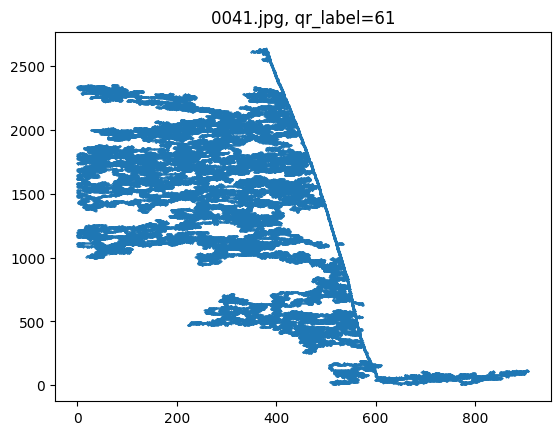

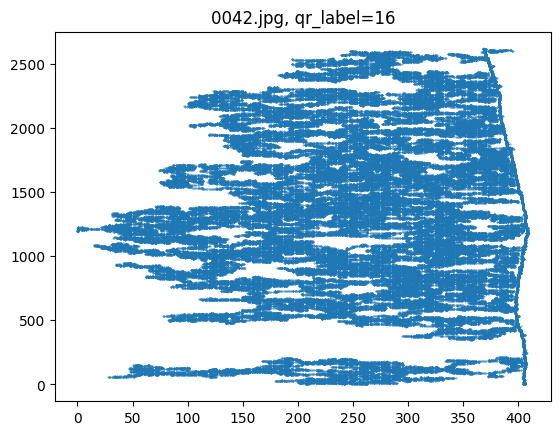

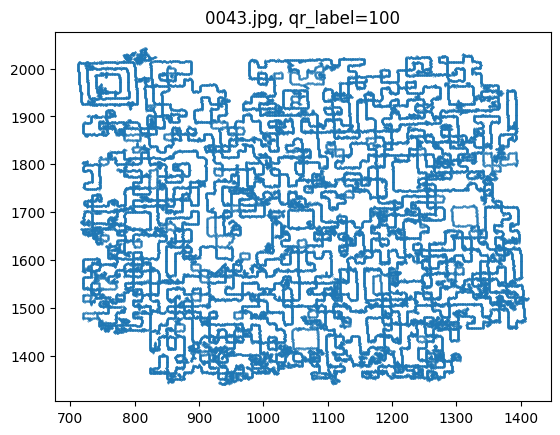

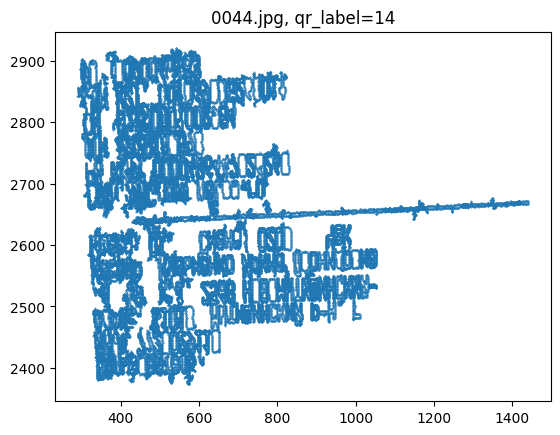

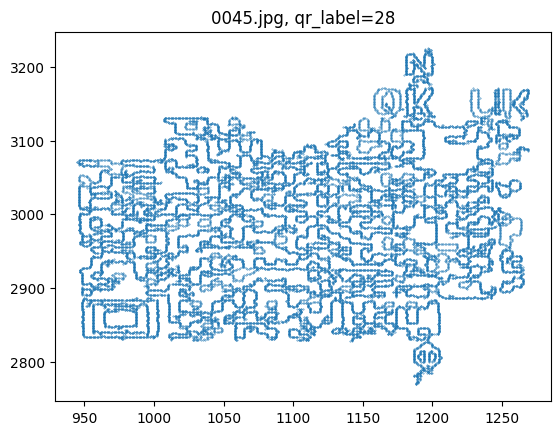

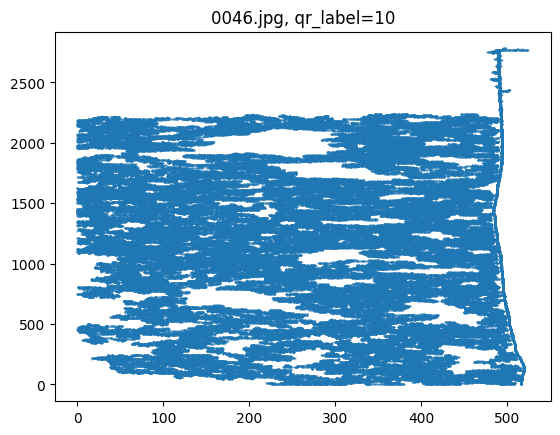

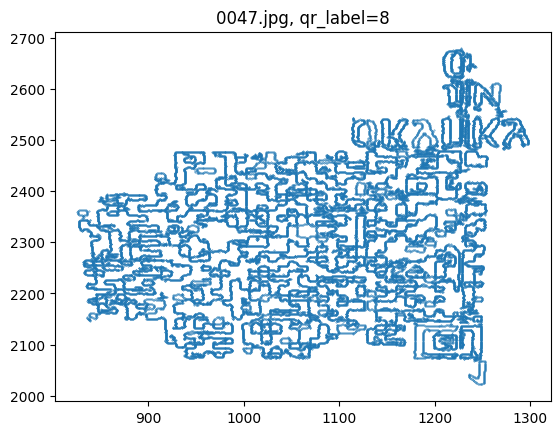

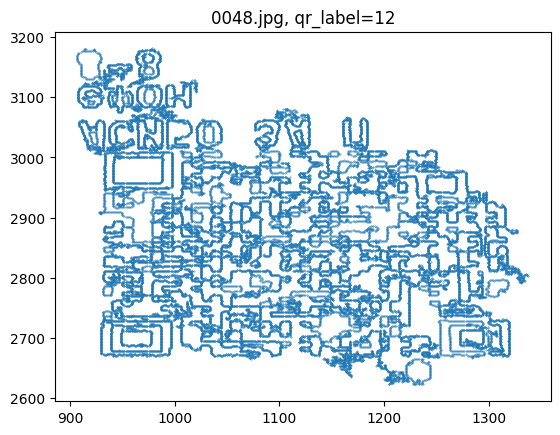

In [43]:
for file in files_2:
  find_qr_code(data_path_2 + '/' + file)

Precision: 0.52 \
Recall: 0.53

In [50]:
print(f'Среднее время на картинку: {np.array(times).mean()}s')

Среднее время на картинку: 9.024750608078977s
